In [1]:
# import relevant packages
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.stats as ss
import seaborn as sns

import torch
import torch_geometric
from torch_geometric.loader import DataLoader

# set figure parameters
sc.settings.set_figure_params(dpi=100)

In [2]:
from celcomen.models.celcomen import celcomen
from celcomen.models.simcomen import simcomen

## define helper functions

In [3]:
# define a function to normalize the g2g
def normalize_g2g(g2g):
    """
    Addresses any small fluctuations in symmetrical weights
    """
    # symmetrize the values
    g2g = (g2g + g2g.T) / 2
    # force them to be between 0-1
    g2g[g2g < 0] = 0
    g2g[g2g > 1] = 1
    # force the central line to be 1
    for idx in range(len(g2g)):
        g2g[idx, idx] = 1
    return g2g

## read in xenium

In [4]:
# read in xenium
avis = sc.read_10x_h5('data/xenium_human_gbm/cell_feature_matrix.h5')
avis.var_names = avis.var_names.astype(str)
avis.var_names_make_unique()
# remove cells with no counts
sc.pp.filter_cells(avis, min_counts=100)
# normalize the data
sc.pp.normalize_total(avis, target_sum=1e6)
sc.pp.log1p(avis)

In [5]:
# read in the spatial
df = pd.read_csv('data/xenium_human_gbm/cells.csv.gz', index_col=0)
df = df.loc[avis.obs.index]

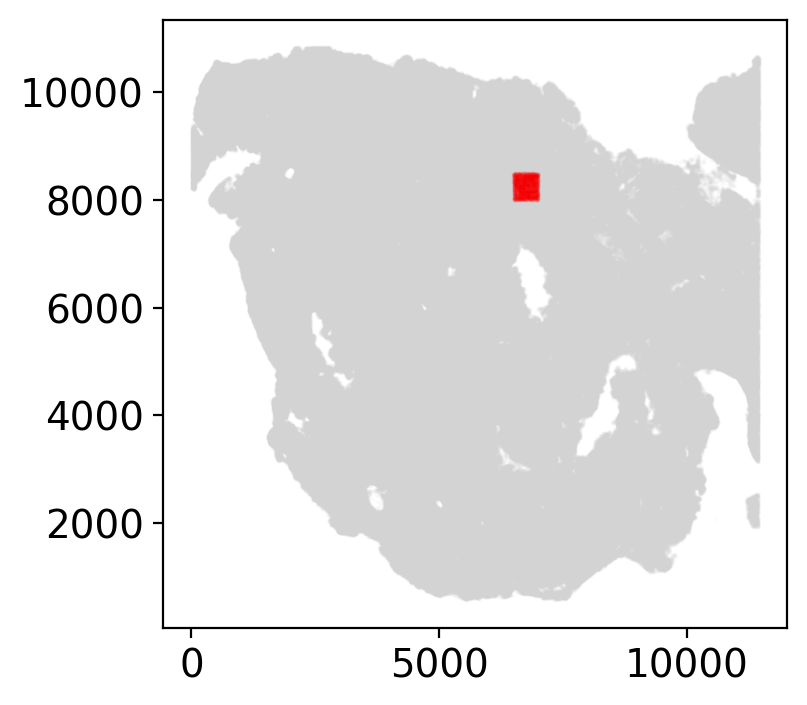

In [6]:
# view the tissue and choose a specific area to focus on
fig, ax = plt.subplots()
ax.grid(False)
ax.scatter(df['x_centroid'], df['y_centroid'], s=0.1, alpha=0.1, color='lightgray')
mask = (df['x_centroid'] < 7000) & (df['x_centroid'] > 6500)
mask = mask & (df['y_centroid'] < 8500) & (df['y_centroid'] > 8000)
ax.scatter(df.loc[mask, 'x_centroid'], df.loc[mask, 'y_centroid'], s=0.1, alpha=0.1, color='r')

In [7]:
# add spatial and subset
avis.obsm['spatial'] = df.loc[avis.obs.index, ['x_centroid','y_centroid']].values
avis = avis[mask].copy()

/nfs/team205/sm58/packages/celcomen_trials/pyg_env/celcomen_tutorial_env/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:251: UserWarning: If you pass `n_top_genes`, all cutoffs are ignored.
  warnings.warn(msg, UserWarning)
/nfs/team205/sm58/packages/celcomen_trials/pyg_env/celcomen_tutorial_env/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:412: UserWarning: `n_top_genes` > number of normalized dispersions, returning all genes with normalized dispersions.
  warnings.warn(msg, UserWarning)


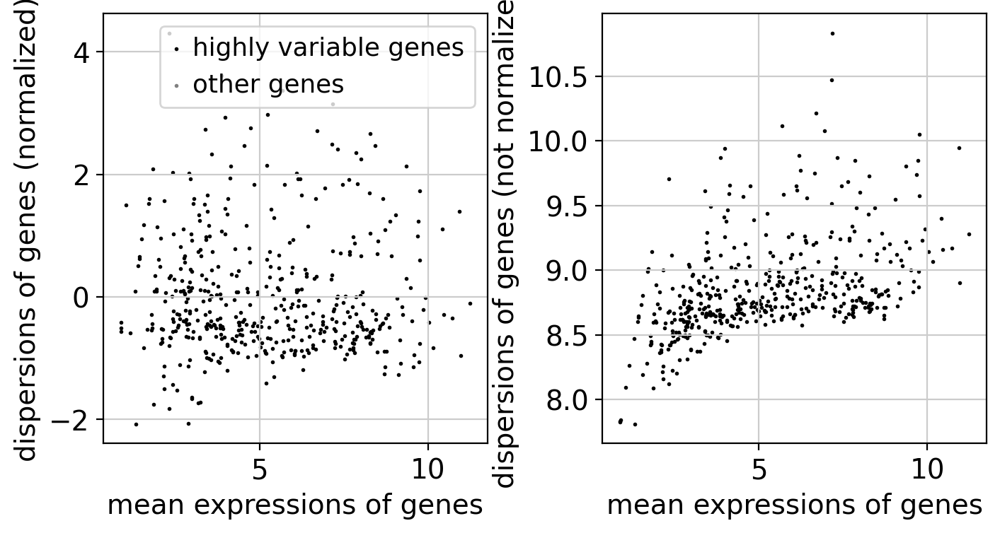

there are 480 hvgs


In [8]:
# compute PCA for the spatial dataset using HVGs
avis.uns['log1p']['base'] = np.e
sc.pp.highly_variable_genes(avis, flavor='seurat', min_mean=0.5, max_mean=7.5, min_disp=0.5, n_top_genes=avis.shape[1])
sc.pl.highly_variable_genes(avis)
# report how many HVGs we're going to use
print('there are', avis.var['highly_variable'].sum(), 'hvgs')

In [9]:
# the dataloader of celcomen takes as input the raw counts which it then log-transforms and normalizes
# so we need to reread the anndata from raw, and subset to the genes we computed based on the log-counts in avis

genes = avis.var_names[avis.var['highly_variable']].tolist()

avis2 = sc.read_10x_h5('data/xenium_human_gbm/cell_feature_matrix.h5')
avis2.var_names = avis.var_names.astype(str)
avis2.var_names_make_unique()
# remove cells with no counts
sc.pp.filter_cells(avis2, min_counts=100)
# insert spatial coordinates
avis2.obsm['spatial'] = df.loc[avis2.obs.index, ['x_centroid','y_centroid']].values

avis3 = avis2[mask, genes].copy()
# put a sample id
sc.pp.filter_genes(avis3, min_cells=5)
avis3.obs["sangerID"] = "sample1"

avis3.write_h5ad(
    'data/xenium_human_gbm/avis_for_data_loading.h5',
)

## learn with CCE for xenium

In [10]:
import torch
torch.cuda.is_available()

True

In [11]:
from scipy.spatial.distance import pdist, squareform

distances = squareform(pdist(df.loc[mask, ['x_centroid','y_centroid']]))
# compute the edges as two cell widths apart so 30µm
edge_index = torch.from_numpy(np.array(np.where((distances < 15)&(distances != 0))))

In [12]:
from celcomen.training_plan.train import train
from celcomen.datareaders.datareader import get_dataset_loaders

In [13]:
genes = avis3.var.index

In [14]:
h5ad_path='data/xenium_human_gbm/avis_for_data_loading.h5'

loader = get_dataset_loaders(h5ad_path, "sangerID", 6, True, )

Step 1
=====
Number of graphs in the current batch: 1
DataBatch(x=[1781, 412], edge_index=[2, 10686], y=[1], pos=[1781, 2], batch=[1781], ptr=[2])



In [15]:
n_genes= len(genes) #33
n_neighbors=6
seed=1
zmft_scalar = 0.1
epochs = 300
learning_rate = 5e-3


model = celcomen(input_dim=n_genes, output_dim=n_genes, n_neighbors=n_neighbors, seed=seed)
model.to("cuda")
losses = train(epochs, learning_rate, model, loader, zmft_scalar=zmft_scalar, seed=1, device="cuda")


100%|███████████████████████████████████████████████████████████| 300/300 [00:05<00:00, 55.10it/s]


[Text(0.5, 0, 'epochs'), Text(0, 0.5, 'loss')]

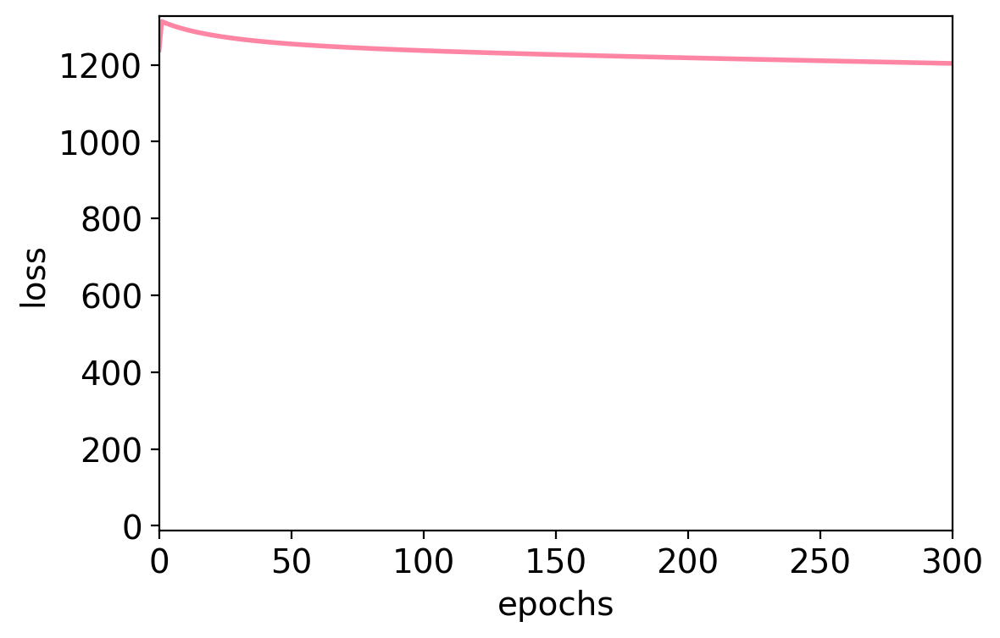

In [16]:
# create the plot
fig, ax = plt.subplots(figsize=[6, 4])
ax.grid(False)
ax.plot(losses, lw=2, color='#fe86a4')
ax.set_xlim(0, epochs)
vmin, vmax = min(min(losses), 0), max(losses)
vstep = (vmax - vmin) * 0.01
ax.set_ylim(vmin-vstep, vmax+vstep)
ax.set(xlabel='epochs', ylabel='loss')

## perform disentanglement

In [17]:
# retrieve the g2gs
g2g_intercellular = pd.DataFrame(model.conv1.lin.weight.detach().cpu().numpy(), index=genes, columns=genes)
g2g_intracellular = pd.DataFrame(model.lin.weight.detach().cpu().numpy(), index=genes, columns=genes)

In [18]:
# define the gene
secs = pd.read_table('data/quickgo_secreted.tsv')['SYMBOL'].unique()
sps = pd.read_table('data/quickgo_surfaceprotein.tsv')['SYMBOL'].unique()
nons = pd.Index(genes)[(~pd.Index(genes).isin(secs))&(~pd.Index(genes).isin(sps))]
secs = pd.Index(genes).intersection(secs)
sps = pd.Index(genes).intersection(sps)

/tmp/ipykernel_3938354/755115305.py:13: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 95)` for the same effect.

  sns.barplot(x=xs[::-1], y=ys[::-1], saturation=1, ci=95, errwidth=2, capsize=0.3, linewidth=2,
/tmp/ipykernel_3938354/755115305.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=xs[::-1], y=ys[::-1], saturation=1, ci=95, errwidth=2, capsize=0.3, linewidth=2,
/tmp/ipykernel_3938354/755115305.py:13: FutureWarning: 

The `errcolor` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'color': 'k'}` instead.

  sns.barplot(x=xs[::-1], y=ys[::-1], saturation=1, ci=95, errwidth=2, capsize=0.3, linewidth=2,
/tmp/ipykernel_3938354/755115305.py:13: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.b

0.7916493459738212
6.602549668308228e-05
0.00011133531698984277


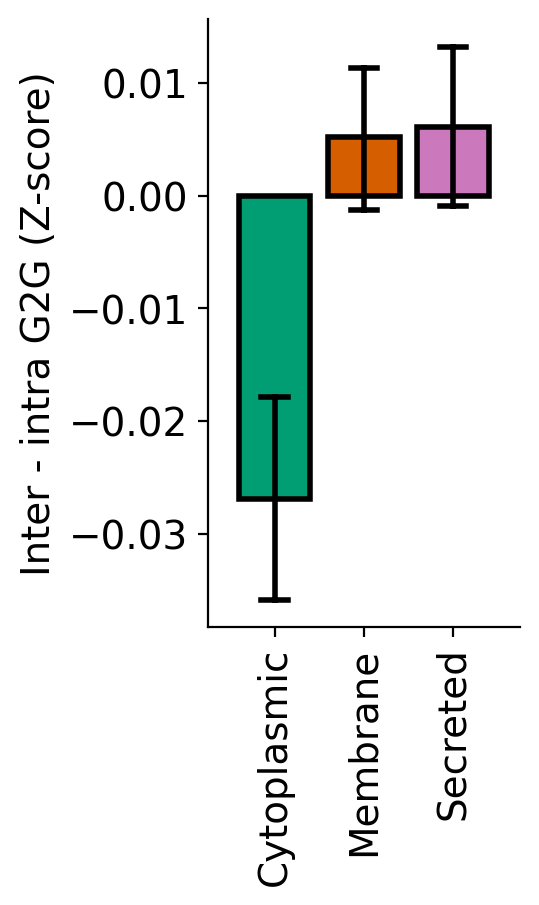

In [19]:
# derive the values
diffs_secs = (g2g_intercellular.loc[secs, :] - g2g_intracellular.loc[secs, :]).values.flatten()
diffs_sps = (g2g_intercellular.loc[sps, :] - g2g_intracellular.loc[sps, :]).values.flatten()
diffs_nons = (g2g_intercellular.loc[nons, :] - g2g_intracellular.loc[nons, :]).values.flatten()
# assemble them
ys = np.hstack([diffs_secs, diffs_sps, diffs_nons])
ys -= ys.mean()
ys /= ys.std()
xs = np.array(['Secreted']*len(diffs_secs)+['Membrane']*len(diffs_sps)+['Cytoplasmic']*len(diffs_nons))
# create plot
fig, ax = plt.subplots(figsize=[2, 4])
ax.grid(False)
sns.barplot(x=xs[::-1], y=ys[::-1], saturation=1, ci=95, errwidth=2, capsize=0.3, linewidth=2,
            errcolor='k', edgecolor='k', palette=['#cc78bc','#d55e00','#029e73'][::-1])
ax.set_xlim(-0.75, 2.75)
ax.tick_params(axis='x', labelrotation=90)
ax.set_ylabel('Inter - intra G2G (Z-score)')
ax.spines[['right', 'top']].set_visible(False)
# derive pvalues
p1 = ss.mannwhitneyu(ys[xs == 'Secreted'], ys[xs == 'Membrane'])[1]
p2 = ss.mannwhitneyu(ys[xs == 'Secreted'], ys[xs == 'Cytoplasmic'])[1]
p3 = ss.mannwhitneyu(ys[xs == 'Cytoplasmic'], ys[xs == 'Membrane'])[1]
print(p1, p2, p3, sep='\n')

## perturb the GBM data

In [20]:
# define a function to derive the gex from the sphex
def calc_sphex(gex):
    """
    Calculates the spherical expression matrix from the normal
    """
    # setup the gex
    n_sgenes = gex.shape[1]-1
    sphex = torch.from_numpy(np.zeros((gex.shape[0], n_sgenes)).astype('float32'))
    # compute the gex
    for idx in range(n_sgenes):
        sphex[:,idx] = gex[:,idx]
        for idx_ in range(idx):
            sphex[:,idx] /= torch.sin(sphex[:,idx_])
        sphex[:,idx] = torch.arccos(sphex[:,idx])
    return sphex

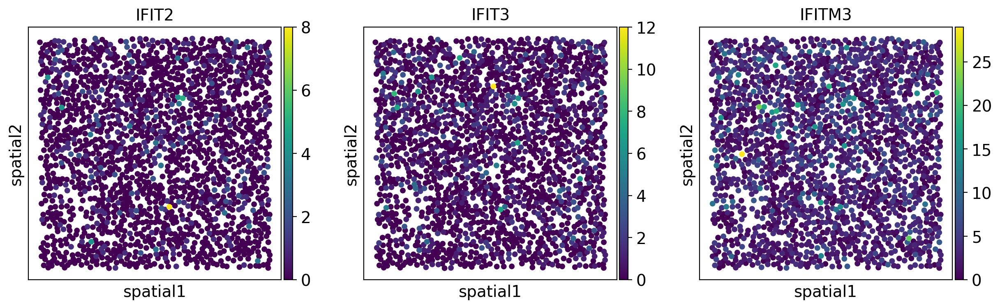

In [21]:
# find the genes
# avis_sub = avis[:, avis.var['highly_variable']].copy()
avis_sub = avis3.copy()
sc.pl.embedding(avis_sub, basis='spatial', color=['IFIT2','IFIT3','IFITM3'], use_raw=False, s=1e2)

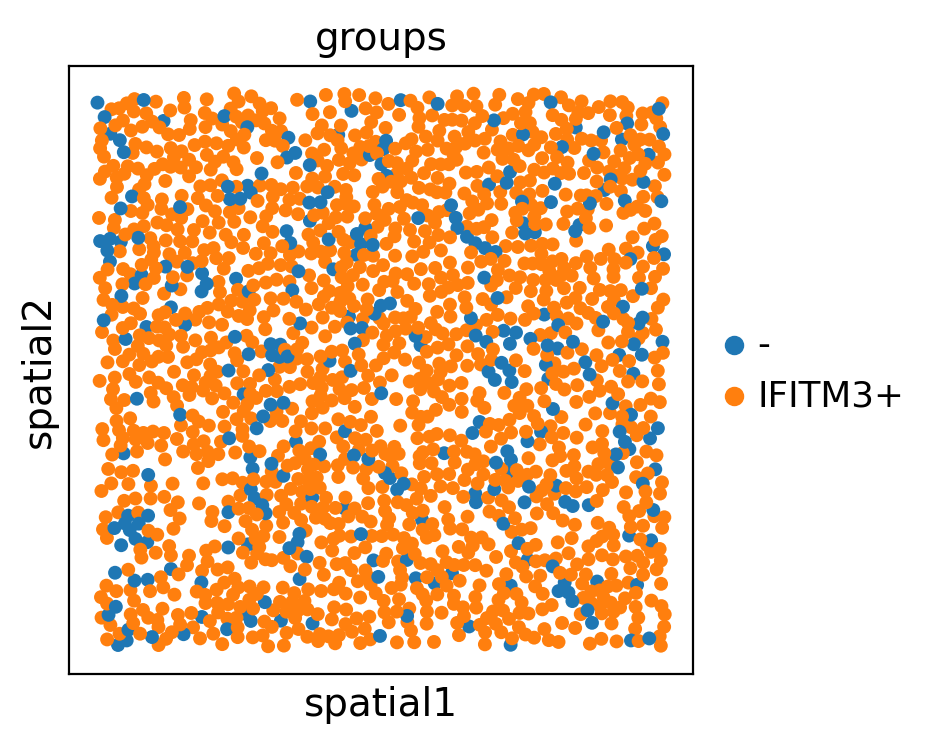

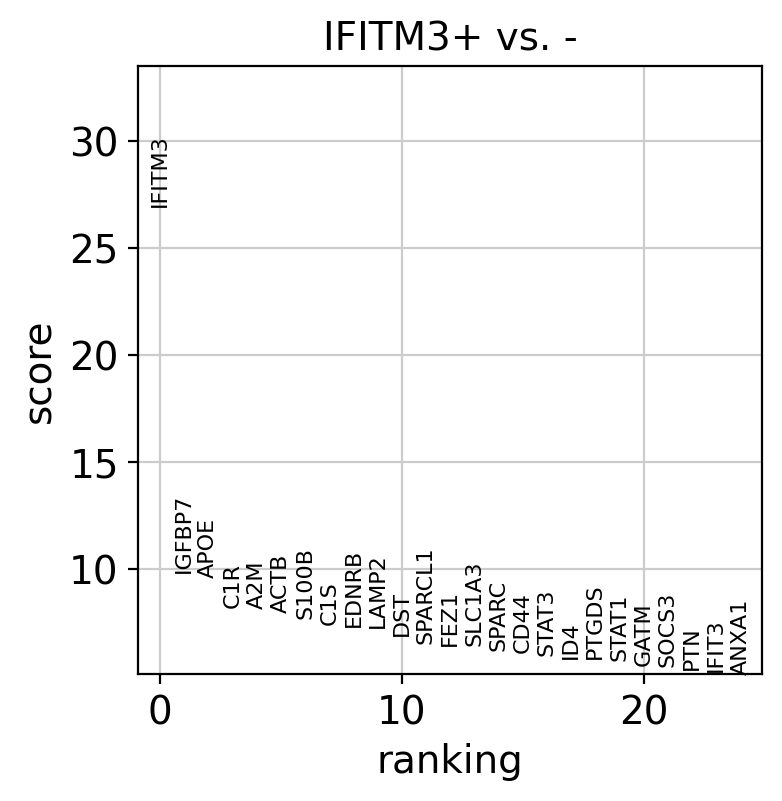

In [22]:
# define the genes that distinguish ISG15 spots currently
avis_sub.obs['groups'] = (sc.get.obs_df(avis_sub, keys=['IFITM3']).max(1) > 0).map({True:'IFITM3+', False:'-'})
sc.pl.embedding(avis_sub, basis='spatial', color=['groups'], use_raw=False, s=1e2)
# calculate differential expression
sc.tl.rank_genes_groups(avis_sub, method='wilcoxon', use_raw=False, groupby='groups', group=['IFITM3+'], reference='-')
sc.pl.rank_genes_groups(avis_sub, n_genes=25, sharey=False)

In [23]:
# derive the signature
'\''+'\',\''.join(pd.DataFrame(avis_sub.uns['rank_genes_groups']['names']).iloc[:25, 0].tolist())+'\''

"'IFITM3','IGFBP7','APOE','C1R','A2M','ACTB','S100B','C1S','EDNRB','LAMP2','DST','SPARCL1','FEZ1','SLC1A3','SPARC','CD44','STAT3','ID4','PTGDS','STAT1','GATM','SOCS3','PTN','IFIT3','ANXA1'"

In [24]:
from scipy.spatial.distance import pdist, squareform

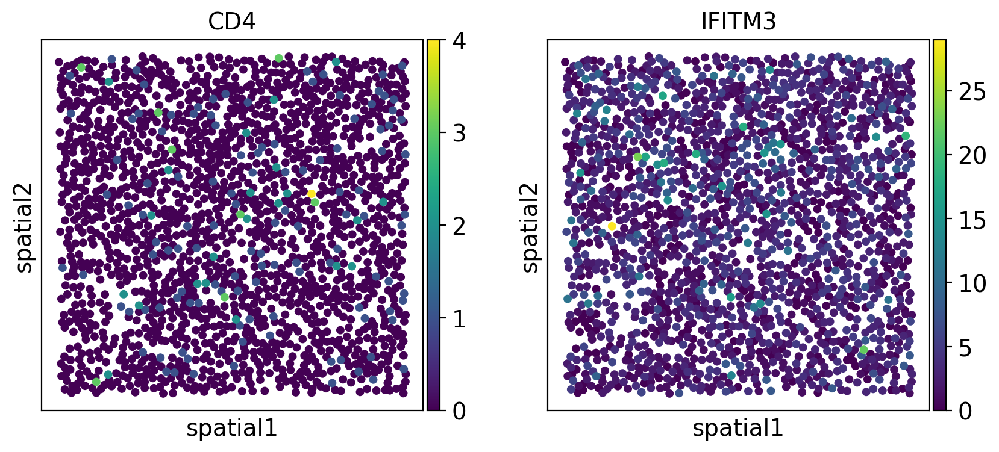

In [25]:
sc.pl.embedding(avis_sub, basis='spatial', color=['CD4','IFITM3'], use_raw=False, s=1e2)



In [26]:
# Extract spatial coordinates from avis_sub
spatial_coords = avis_sub.obsm["spatial"]

# Find the minimum and maximum values for x and y coordinates
x_min, y_min = spatial_coords.min(axis=0)
x_max, y_max = spatial_coords.max(axis=0)

print(f"x_min: {x_min}, x_max: {x_max}, y_min: {y_min}, y_max: {y_max}")

x_min: 6500.10302734375, x_max: 6999.6416015625, y_min: 8000.41015625, y_max: 8499.4921875


In [27]:
# Ensure 'IFITM3' is in your gene list
if 'IFITM3' in avis_sub.var_names:
    # Get the expression values for IFITM3 across all cells
    ifitm3_expr = avis_sub[:, 'IFITM3'].X.toarray().flatten()  # convert to a 1D array

    # Find the index of the cell with the highest IFITM3 expression
    highest_ifitm3_cell_idx = np.argmax(ifitm3_expr)

    # Get the spatial coordinates of the cell with the highest IFITM3 expression
    ifitm3_highest_coords = avis_sub.obsm['spatial'][highest_ifitm3_cell_idx]

    print(f"Coordinates of the cell with the highest IFITM3 expression: {ifitm3_highest_coords}")
else:
    print("IFITM3 gene not found in dataset.")

Coordinates of the cell with the highest IFITM3 expression: [6567.55029297 8248.24707031]


In [28]:
new_coords = ifitm3_highest_coords.copy()
new_coords[0] = new_coords[0]+5
new_coords[1] = new_coords[1]+5
print(new_coords)

[6572.55029297 8253.24707031]


In [29]:
# Ensure 'CD4' is in your gene list
if 'CD4' in avis_sub.var_names:
    # Get the expression values for CD4 across all cells
    cd4_expr = avis_sub[:, 'CD4'].X.toarray().flatten()  # convert to a 1D array

    # Find the highest CD4 expression value
    max_cd4_expr = np.max(cd4_expr)

    # Find all cells that have this maximum CD4 expression value
    highest_cd4_cells = np.where(cd4_expr == max_cd4_expr)[0]

    # Randomly select one cell from the cells with the highest CD4 expression
    selected_cell_idx = np.random.choice(highest_cd4_cells)

    # Subset avis to get the cell with the highest CD4 expression
    avis_new_cell = avis_sub[selected_cell_idx, :].copy()

    # change the coordinates of the new cell to be clode to the highest IFITM3 cell
    avis_new_cell.obsm["spatial"] = np.array([new_coords])

    # Create a new avis_new which is a copy of the original avis
    avis_prompt = avis_sub.copy()

    # Stack avis_new and avis_sub (add the selected cell twice to the new object)
    avis_prompt = avis_prompt.concatenate([avis_new_cell])

    # Now avis_sub contains the single cell with the highest CD4 expression
    print(f"Randomly selected cell index: {selected_cell_idx}")
    print(f"avis_prompt: {avis_prompt}")
    
else:
    print("CD4 gene not found in dataset.")


Randomly selected cell index: 849
avis_prompt: AnnData object with n_obs × n_vars = 1782 × 412
    obs: 'n_counts', 'sangerID', 'groups', 'batch'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    obsm: 'spatial'


/tmp/ipykernel_3938354/36844954.py:25: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  avis_prompt = avis_prompt.concatenate([avis_new_cell])


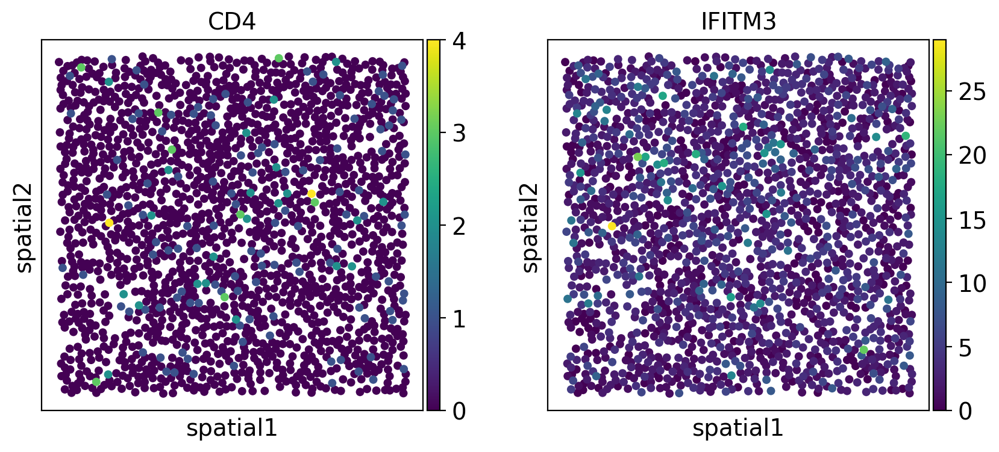

In [30]:
sc.pl.embedding(avis_prompt, basis='spatial', color=['CD4','IFITM3'], use_raw=False, s=1e2)


In [31]:
avis_prompt

AnnData object with n_obs × n_vars = 1782 × 412
    obs: 'n_counts', 'sangerID', 'groups', 'batch'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    obsm: 'spatial'

In [36]:
# # visualize T-cell insertion

# # annotate cells as inserted, neighbors, or unperturbed
# mask = [0 for i in range(avis_prompt.shape[0])]
# mask[-1]=1
# print(avis_prompt)

# avis_prompt.obs['perturbed'] = 'unperturbed'
# print(avis_prompt)
# avis_prompt.obs['perturbed'].iloc[np.where(squareform(pdist(avis_prompt.obsm['spatial']))[mask, :] < 30)[1]] = 'perturbed-neighbors1'
# print(avis_prompt)
# avis_prompt.obs['perturbed'].iloc[np.where(squareform(pdist(avis_prompt.obsm['spatial']))[mask, :] < 15)[1]] = 'perturbed-neighbors0'
# perturbed_cell_index = np.where(mask)[0][0]
# print(perturbed_cell_index)
# #avis_prompt.obs.loc[perturbed_cell_index, 'perturbed'] = 'perturbed'
# avis_prompt.obs.iloc[perturbed_cell_index, avis_prompt.obs.columns.get_loc('perturbed')] = 'perturbed'
# print(avis_prompt)
# avis_prompt.uns['perturbed_colors'] = ['#ff47a6','#f593c2','#f7cbe0','#f7ebf1']
# print(avis_prompt)
# sc.pl.embedding(avis_prompt, basis='spatial', color=['perturbed'], use_raw=False, s=1e2)

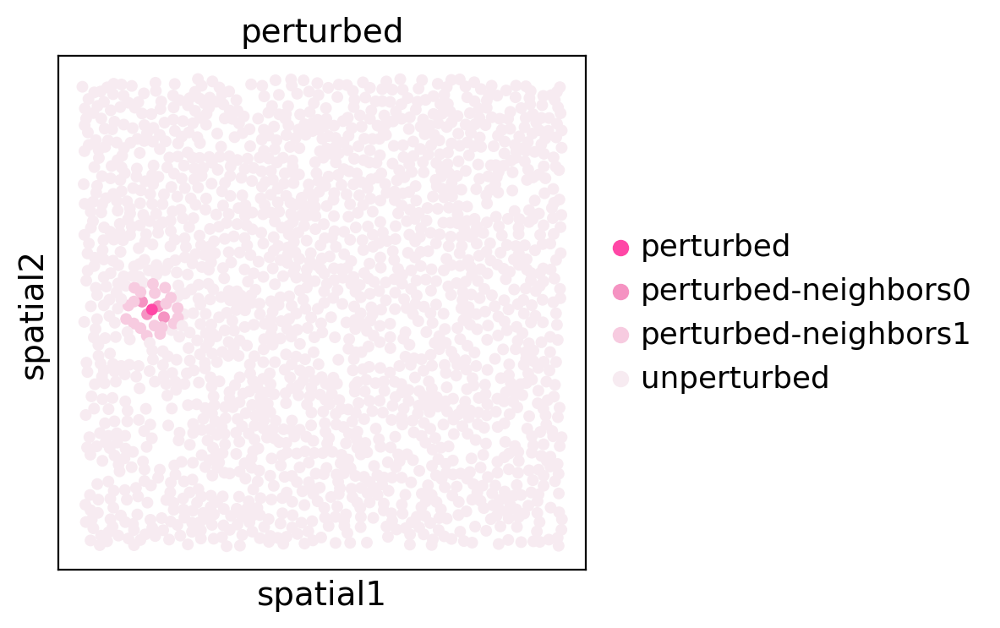

In [35]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
import scanpy as sc

# Step 1: Reset the 'perturbed' column to avoid accumulation
avis_prompt.obs['perturbed'] = 'unperturbed'

# Step 2: Identify the index of the perturbed cell
perturbed_cell_index = avis_prompt.shape[0] - 1  # Assuming the last cell is perturbed

# Step 3: Compute the distance matrix
distance_matrix = squareform(pdist(avis_prompt.obsm['spatial']))

# Step 4: Get distances from the perturbed cell to all other cells
distances = distance_matrix[perturbed_cell_index, :]

# Step 5: Find indices of neighbors within 30 units
neighbors_30 = np.where(distances < 30)[0]
avis_prompt.obs.iloc[neighbors_30, avis_prompt.obs.columns.get_loc('perturbed')] = 'perturbed-neighbors1'

# Step 6: Find indices of neighbors within 15 units
neighbors_15 = np.where(distances < 15)[0]
avis_prompt.obs.iloc[neighbors_15, avis_prompt.obs.columns.get_loc('perturbed')] = 'perturbed-neighbors0'

# Step 7: Annotate the perturbed cell itself
avis_prompt.obs.iloc[perturbed_cell_index, avis_prompt.obs.columns.get_loc('perturbed')] = 'perturbed'

# Step 8: Set custom colors for visualization
avis_prompt.uns['perturbed_colors'] = ['#ff47a6', '#f593c2', '#f7cbe0', '#f7ebf1']

# Step 9: Visualize the embedding with perturbed labels
sc.pl.embedding(avis_prompt, basis='spatial', color=['perturbed'], use_raw=False, s=1e2)


## Run Simcomen

In [37]:
# define the parameters of the model
n_genes = avis_prompt.shape[1]
learning_rate = 1e-3
zmft_scalar = 1e-1
seed = 0
epochs = 50

In [38]:
prompt_x = avis_prompt.X.toarray().copy()
np.max(prompt_x)

81.0

In [39]:
# instantiate the model, input and output will be the same
model_gen = simcomen(input_dim=n_genes, output_dim=n_genes, n_neighbors=n_neighbors, seed=seed)
# now perform the simulation
np.random.seed(seed)
# retrieve expression from 
# convert the gene expression data to numpy
x = torch.from_numpy(prompt_x)
# sphere normalize the data (just in case)
norm_factor = torch.sqrt(torch.pow(x, 2).sum(1)).reshape(-1,1)
assert (norm_factor > 0).all()
x = torch.div(x, norm_factor)
# artifically set the g2g matrix
model_gen.set_g2g(model.conv1.lin.weight.clone().detach())
model_gen.set_g2g_intra(model.lin.weight.clone().detach())
# initialize a gene expression matrix
input_sphex = calc_sphex(x).clone().detach().numpy()


In [40]:
next(model_gen.parameters()).device

device(type='cpu')

In [41]:
# move tensors and model to device cuda
device="cuda"
model_gen.to("cuda")
model_gen.set_sphex( torch.from_numpy(input_sphex.astype('float32')).to("cuda")  )

In [42]:
from tqdm import tqdm
# set up the optimizer
optimizer = torch.optim.SGD(model_gen.parameters(), lr=learning_rate, momentum=0)
# keep track of the losses per data object
loss, losses = None, []
# train the model
model_gen.train()
tmp_gexs = []
# work through epochs
for epoch in tqdm(range(epochs), total=epochs):
    # derive the message as well as the mean field approximation
    msg, msg_intra, log_z_mft = model_gen(edge_index.to('cuda'), 1)
    if (epoch % 5) == 0:
        if device=="cpu":
            tmp_gex = model_gen.gex.clone().detach().numpy()
        else:
            tmp_gex = model_gen.gex.clone().detach().cpu().numpy()
        tmp_gexs.append(tmp_gex)
    # compute the loss and track it
    loss = -(-log_z_mft + zmft_scalar * torch.trace(torch.mm(msg, torch.t(model_gen.gex))) + zmft_scalar * torch.trace(torch.mm(msg_intra, torch.t(model_gen.gex))) )
    if device=="cpu":
        losses.append(loss.detach().numpy()[0][0])
    else:
        losses.append(loss.detach().cpu().numpy()[0][0])    
    print(f"Loss={losses[-1]}")
    # derive the gradients, update, and clear
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()

  0%|                                                                      | 0/50 [00:00<?, ?it/s]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=3482.249755859375


  2%|█▏                                                            | 1/50 [00:13<10:59, 13.46s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1495.2130126953125


  4%|██▍                                                           | 2/50 [00:27<10:58, 13.71s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1493.391845703125


  6%|███▋                                                          | 3/50 [00:41<10:59, 14.04s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1491.6842041015625


  8%|████▉                                                         | 4/50 [00:56<10:55, 14.24s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1490.0819091796875


 10%|██████▏                                                       | 5/50 [01:10<10:46, 14.37s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1488.5782470703125


 12%|███████▍                                                      | 6/50 [01:25<10:36, 14.47s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1487.1663818359375


 14%|████████▋                                                     | 7/50 [01:39<10:20, 14.42s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1485.84033203125


 16%|█████████▉                                                    | 8/50 [01:54<10:10, 14.53s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1484.5938720703125


 18%|███████████▏                                                  | 9/50 [02:09<09:55, 14.52s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1483.4212646484375


 20%|████████████▏                                                | 10/50 [02:23<09:40, 14.51s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1482.318115234375


 22%|█████████████▍                                               | 11/50 [02:38<09:26, 14.53s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1481.2791748046875


 24%|██████████████▋                                              | 12/50 [02:52<09:12, 14.53s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1480.2999267578125


 26%|███████████████▊                                             | 13/50 [03:07<08:56, 14.50s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1479.3765869140625


 28%|█████████████████                                            | 14/50 [03:21<08:42, 14.52s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1478.5052490234375


 30%|██████████████████▎                                          | 15/50 [03:36<08:27, 14.50s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1477.681640625


 32%|███████████████████▌                                         | 16/50 [03:50<08:13, 14.53s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1476.903564453125


 34%|████████████████████▋                                        | 17/50 [04:05<08:00, 14.56s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1476.1668701171875


 36%|█████████████████████▉                                       | 18/50 [04:19<07:44, 14.53s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1475.4688720703125


 38%|███████████████████████▏                                     | 19/50 [04:34<07:29, 14.50s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1474.806884765625


 40%|████████████████████████▍                                    | 20/50 [04:48<07:13, 14.44s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1474.1787109375


 42%|█████████████████████████▌                                   | 21/50 [05:03<07:00, 14.51s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1473.5819091796875


 44%|██████████████████████████▊                                  | 22/50 [05:17<06:46, 14.53s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1473.013427734375


 46%|████████████████████████████                                 | 23/50 [05:32<06:32, 14.53s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1472.472412109375


 48%|█████████████████████████████▎                               | 24/50 [05:46<06:17, 14.51s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1471.95654296875


 50%|██████████████████████████████▌                              | 25/50 [06:01<06:02, 14.50s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1471.4637451171875


 52%|███████████████████████████████▋                             | 26/50 [06:15<05:48, 14.50s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1470.9921875


 54%|████████████████████████████████▉                            | 27/50 [06:30<05:33, 14.51s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1470.54150390625


 56%|██████████████████████████████████▏                          | 28/50 [06:44<05:18, 14.49s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1470.109130859375


 58%|███████████████████████████████████▍                         | 29/50 [06:59<05:03, 14.47s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1469.694091796875


 60%|████████████████████████████████████▌                        | 30/50 [07:13<04:50, 14.53s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1469.29541015625


 62%|█████████████████████████████████████▊                       | 31/50 [07:28<04:36, 14.57s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1468.9114990234375


 64%|███████████████████████████████████████                      | 32/50 [07:42<04:21, 14.51s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1468.5413818359375


 66%|████████████████████████████████████████▎                    | 33/50 [07:57<04:07, 14.54s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1468.1842041015625


 68%|█████████████████████████████████████████▍                   | 34/50 [08:12<03:52, 14.52s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1467.8388671875


 70%|██████████████████████████████████████████▋                  | 35/50 [08:26<03:37, 14.52s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1467.5050048828125


 72%|███████████████████████████████████████████▉                 | 36/50 [08:41<03:23, 14.53s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1467.181640625


 74%|█████████████████████████████████████████████▏               | 37/50 [08:55<03:08, 14.53s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1466.867431640625


 76%|██████████████████████████████████████████████▎              | 38/50 [09:10<02:54, 14.51s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1466.56201171875


 78%|███████████████████████████████████████████████▌             | 39/50 [09:24<02:39, 14.53s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1466.26513671875


 80%|████████████████████████████████████████████████▊            | 40/50 [09:39<02:25, 14.52s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1465.975830078125


 82%|██████████████████████████████████████████████████           | 41/50 [09:53<02:10, 14.52s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1465.6934814453125


 84%|███████████████████████████████████████████████████▏         | 42/50 [10:08<01:56, 14.58s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1465.41845703125


 86%|████████████████████████████████████████████████████▍        | 43/50 [10:22<01:41, 14.55s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1465.1490478515625


 88%|█████████████████████████████████████████████████████▋       | 44/50 [10:37<01:27, 14.53s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1464.884765625


 90%|██████████████████████████████████████████████████████▉      | 45/50 [10:51<01:12, 14.46s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1464.62646484375


 92%|████████████████████████████████████████████████████████     | 46/50 [11:06<00:58, 14.54s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1464.3724365234375


 94%|█████████████████████████████████████████████████████████▎   | 47/50 [11:21<00:43, 14.56s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1464.12353515625


 96%|██████████████████████████████████████████████████████████▌  | 48/50 [11:35<00:29, 14.57s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1463.878173828125


 98%|███████████████████████████████████████████████████████████▊ | 49/50 [11:50<00:14, 14.53s/it]

self.gex device is cuda:0
edge_index device is cuda:0
Loss=1463.63720703125


100%|█████████████████████████████████████████████████████████████| 50/50 [12:04<00:00, 14.49s/it]


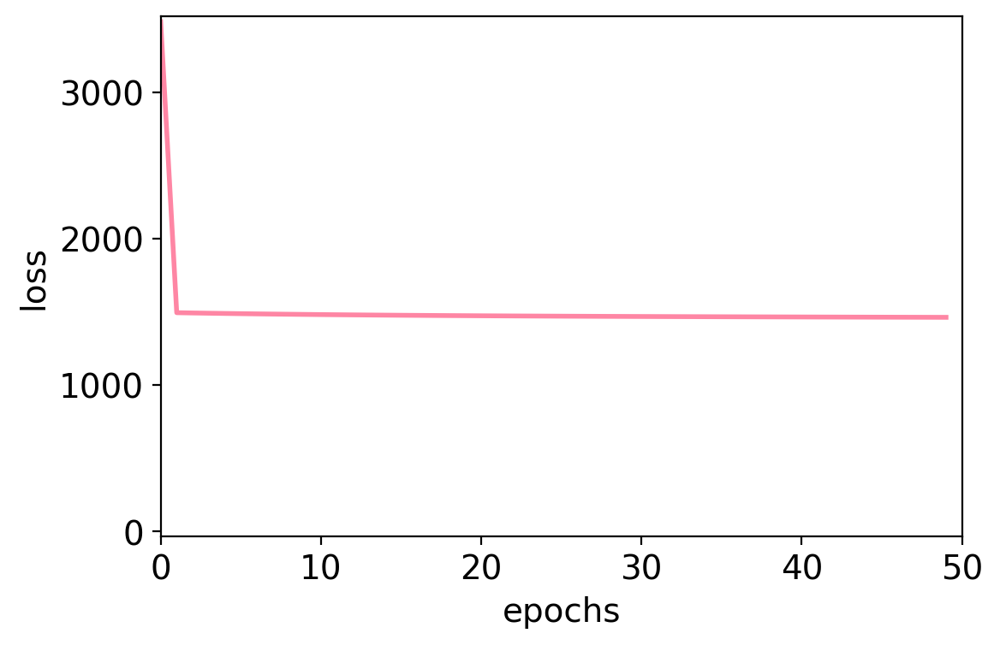

In [43]:
# plot the loss
fig, ax = plt.subplots(figsize=[6, 4])
ax.grid(False)
ax.plot(losses, lw=2, color='#fe86a4')
ax.set_xlim(0, epochs)
vmin, vmax = min(min(losses), 0), max(losses)
vstep = (vmax - vmin) * 0.01
ax.set_ylim(vmin-vstep, vmax+vstep)
ax.set(xlabel='epochs', ylabel='loss')
# retrieve the data
if device=="cpu":
    output_gex = model_gen.gex.detach().numpy()
    output_msg = msg.detach().numpy()
else:
    output_gex = model_gen.gex.detach().cpu().numpy()
    output_msg = msg.detach().cpu().numpy()

In [44]:
# find the genes of interest
genes = ['CD4','IFITM3','IFIT3','MX1','IRF1']
genes = [x for x in genes if x in avis_prompt.var_names.tolist()]

In [45]:
# add the layers
for idx, tmp_gex in enumerate(tmp_gexs):
    avis_prompt.layers[f'input{idx}'] = tmp_gex
avis_prompt.layers['output'] = output_gex

In [46]:
avis_prompt

AnnData object with n_obs × n_vars = 1782 × 412
    obs: 'n_counts', 'sangerID', 'groups', 'batch', 'perturbed'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'perturbed_colors'
    obsm: 'spatial'
    layers: 'input0', 'input1', 'input2', 'input3', 'input4', 'input5', 'input6', 'input7', 'input8', 'input9', 'output'

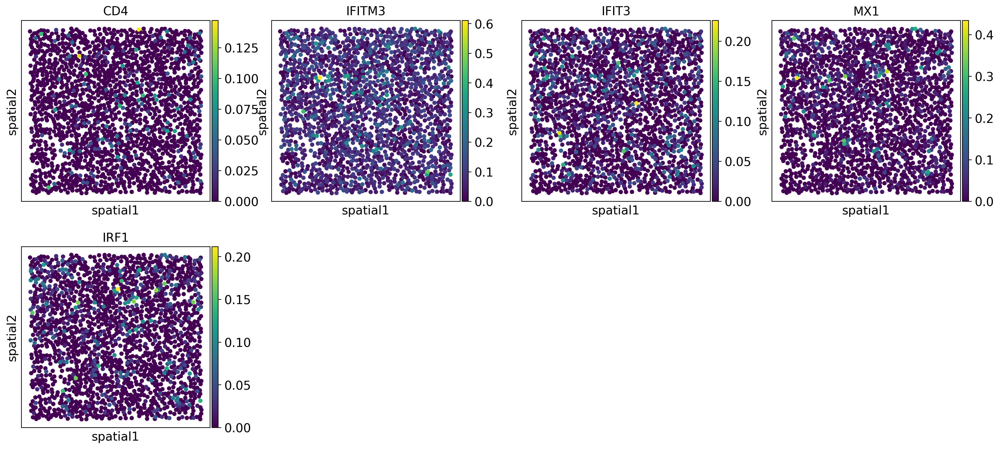

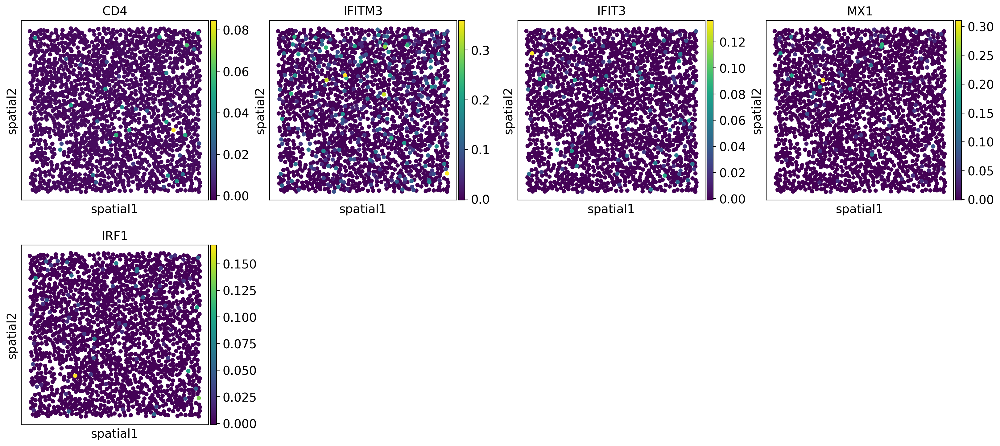

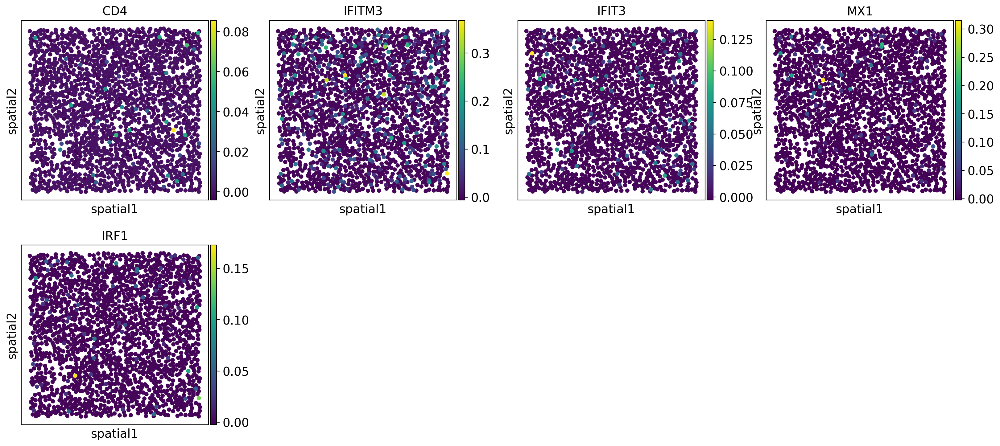

In [47]:
# plot the genes of interest
sc.pl.embedding(avis_prompt, basis='spatial', color=genes, use_raw=False, s=1e2, layer='input0')
sc.pl.embedding(avis_prompt, basis='spatial', color=genes, use_raw=False, s=1e2, layer='input3')
sc.pl.embedding(avis_prompt, basis='spatial', color=genes, use_raw=False, s=1e2, layer='output')

In [45]:
# compute the differential within the area of interest vs outside
avis_prompt.layers['diff'] = avis_prompt.layers['output'] - avis_prompt.layers['input0']
mask0 = avis_prompt.obs['perturbed'] == 'unperturbed'
mask1 = avis_prompt.obs['perturbed'] == 'perturbed'
diff_in_vs_out_p = pd.Series((avis_prompt.layers['diff'][mask1].mean(0) - avis_prompt.layers['diff'][mask0].mean(0)),
                             index=avis_prompt.var_names).sort_values()[::-1]
# now compute differential for neighbors
mask1 = avis_prompt.obs['perturbed'] == 'perturbed-neighbors0'
diff_in_vs_out_pn0 = pd.Series((avis_prompt.layers['diff'][mask1].mean(0) - avis_prompt.layers['diff'][mask0].mean(0)),
                             index=avis_prompt.var_names).sort_values()[::-1]
mask1 = avis_prompt.obs['perturbed'] == 'perturbed-neighbors1'
diff_in_vs_out_pn1 = pd.Series((avis_prompt.layers['diff'][mask1].mean(0) - avis_prompt.layers['diff'][mask0].mean(0)),
                             index=avis_prompt.var_names).sort_values()[::-1]
# remove the perturbed genes to get a clean look
perturbed_genes = ['IFITM3']
perturbed_label = 'ifitm3'
diff_in_vs_out_p = diff_in_vs_out_p.loc[~diff_in_vs_out_p.index.isin(perturbed_genes)]
diff_in_vs_out_pn0 = diff_in_vs_out_pn0.loc[~diff_in_vs_out_pn0.index.isin(perturbed_genes)]
diff_in_vs_out_pn1 = diff_in_vs_out_pn1.loc[~diff_in_vs_out_pn1.index.isin(perturbed_genes)]
# write these matrices out
diff_in_vs_out_p.to_csv(f'20240618.learn_then_perturb.xenium_gbm.{perturbed_label}.diff_in_vs_out_p.csv')
diff_in_vs_out_pn0.to_csv(f'20240618.learn_then_perturb.xenium_gbm.{perturbed_label}.diff_in_vs_out_pn0.csv')
diff_in_vs_out_pn1.to_csv(f'20240618.learn_then_perturb.xenium_gbm.{perturbed_label}.diff_in_vs_out_pn1.csv')

In [46]:
# do not include isg15 itself
genes_ = pd.DataFrame(avis_prompt.uns['rank_genes_groups']['names']).iloc[:25, 0].tolist()[1:]

In [47]:
# retrieve the results
df_expr = pd.DataFrame(columns=['p','pn0','pn1','u'])
for layer in ['input1','input2','input3','input4','input5','input6','input7','input8','input9','output']:
    # compute the expression
    mask1 = avis_prompt.obs['perturbed'] == 'perturbed'
    expr_p = pd.Series(avis_prompt.layers[layer][mask1].mean(0), index=avis_prompt.var_names).loc[genes_].mean()
    mask1 = avis_prompt.obs['perturbed'] == 'perturbed-neighbors0'
    expr_pn0 = pd.Series(avis_prompt.layers[layer][mask1].mean(0), index=avis_prompt.var_names).loc[genes_].mean()
    mask1 = avis_prompt.obs['perturbed'] == 'perturbed-neighbors1'
    expr_pn1 = pd.Series(avis_prompt.layers[layer][mask1].mean(0), index=avis_prompt.var_names).loc[genes_].mean()
    mask1 = avis_prompt.obs['perturbed'] == 'unperturbed'
    expr_u = pd.Series(avis_prompt.layers[layer][mask1].mean(0), index=avis_prompt.var_names).loc[genes_].mean()
    df_expr.loc[layer] = expr_p, expr_pn0, expr_pn1, expr_u

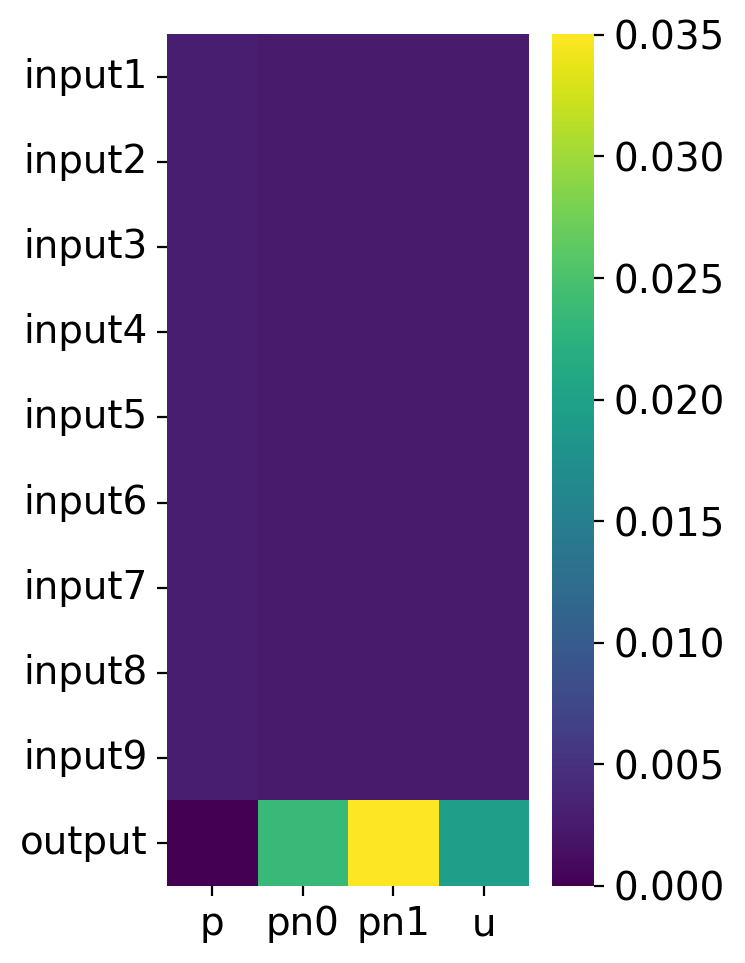

In [48]:
# derive the scores
fig, ax = plt.subplots(figsize=[2.9, 5.6])
ax = sns.heatmap(df_expr, cmap='viridis')
ax.grid(False)

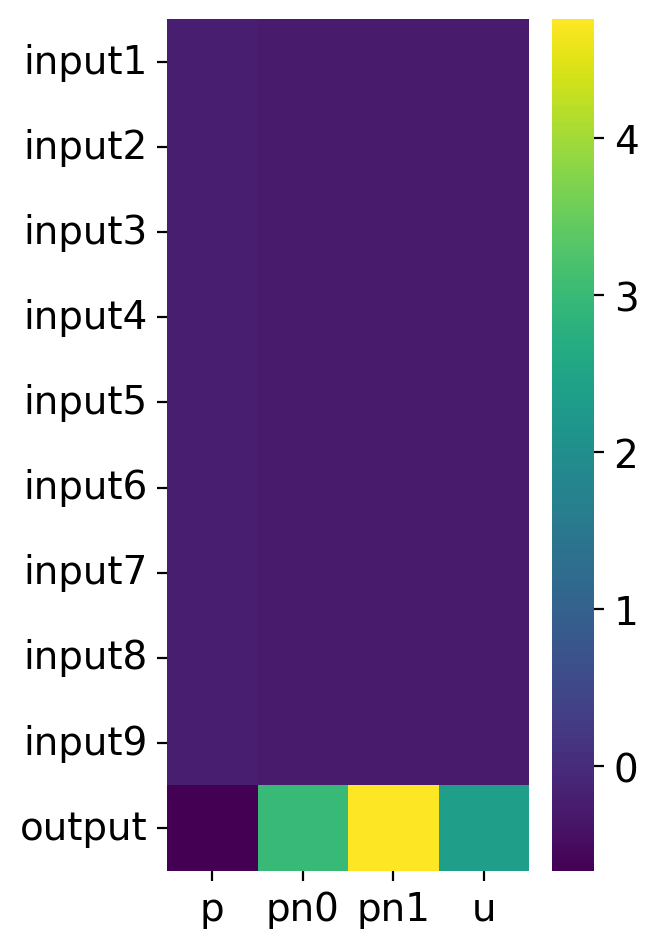

In [49]:
# derive the scores
df_expr -= np.mean(df_expr.values.flatten())
df_expr /= np.std(df_expr.values.flatten())
fig, ax = plt.subplots(figsize=[2.9, 5.6])
ax = sns.heatmap(df_expr, cmap='viridis')
ax.grid(False)

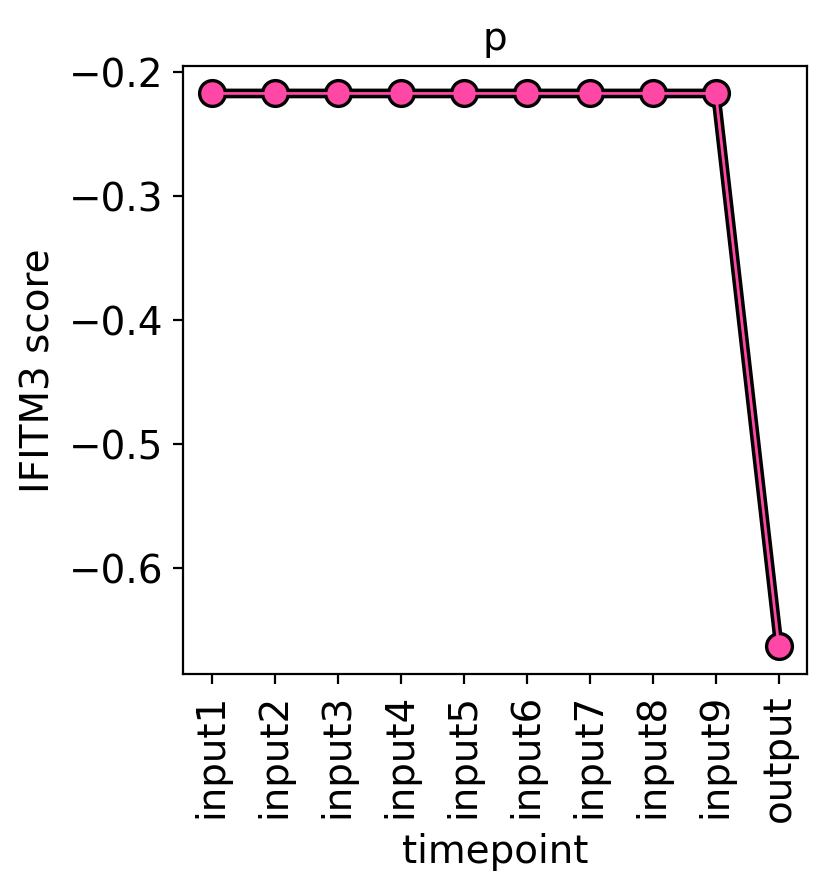

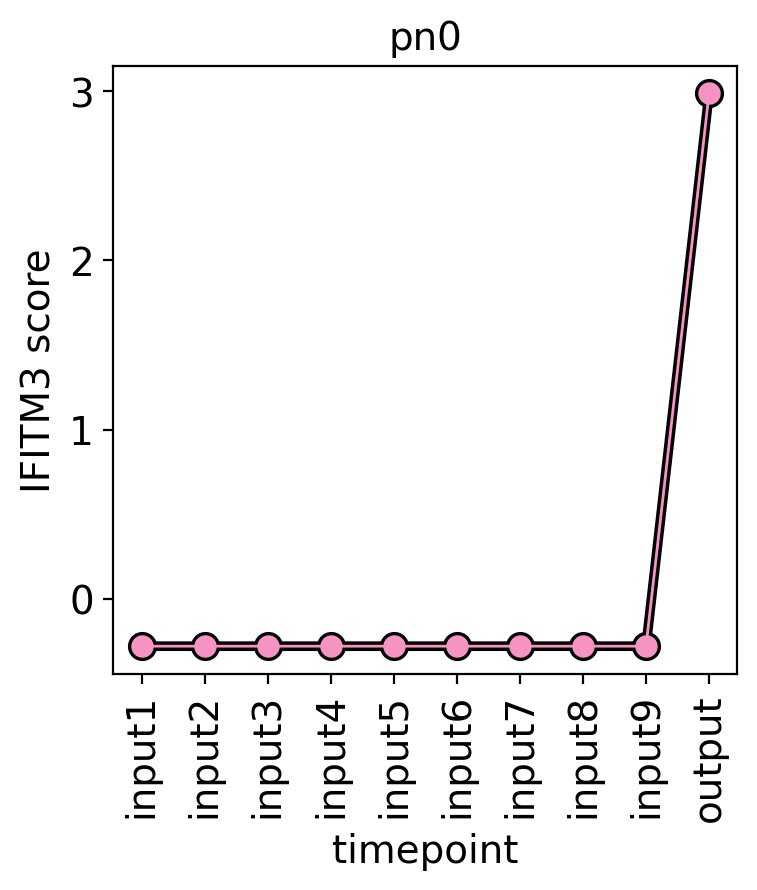

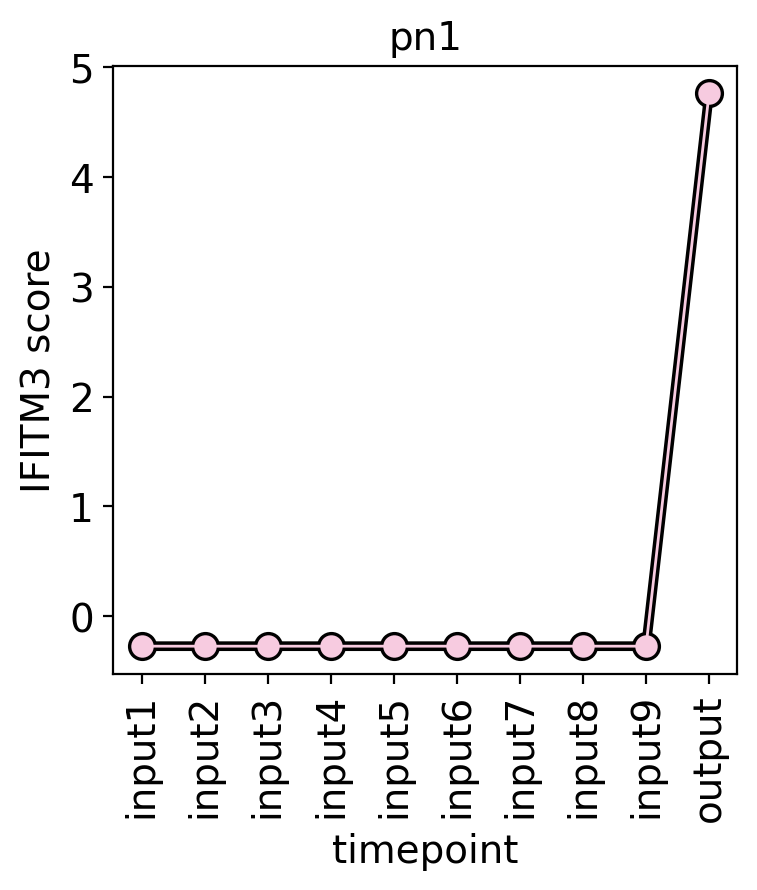

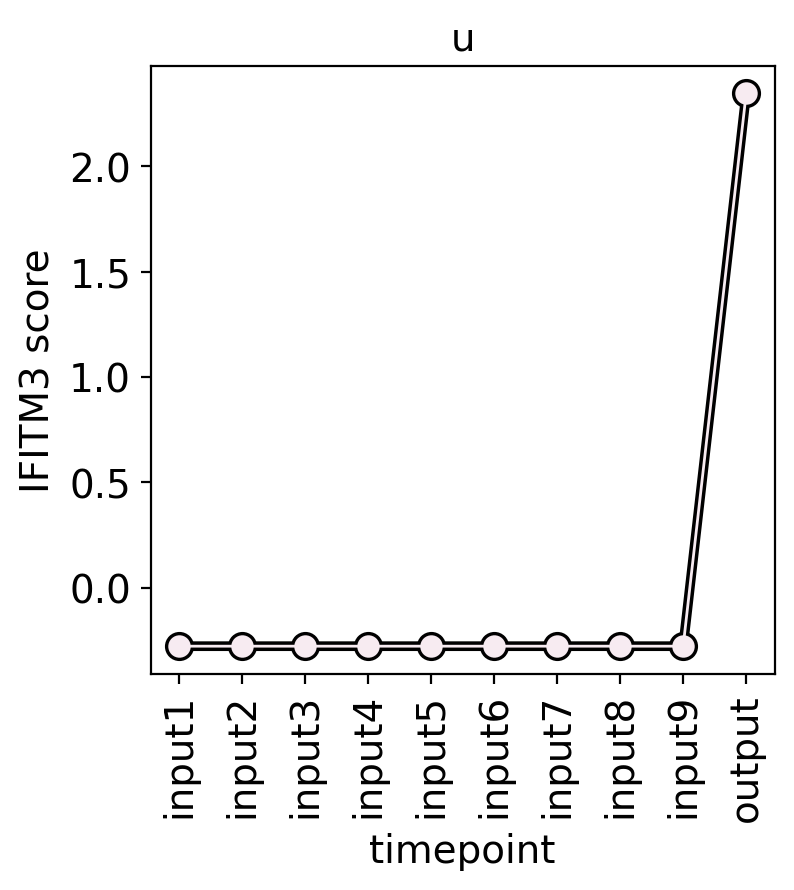

In [50]:
# derive the scores
for col, color in zip(['p','pn0','pn1','u'], ['#ff47a6','#f593c2','#f7cbe0','#f7ebf1']):
    fig, ax = plt.subplots(figsize=[4, 4])
    ax.scatter(df_expr.index, df_expr[col], color='k', s=9e1, zorder=1)
    ax.scatter(df_expr.index, df_expr[col], color=color, s=5e1, zorder=2)
    ax.plot(df_expr.index, df_expr[col], color='k', lw=3.5, zorder=0)
    ax.plot(df_expr.index, df_expr[col], color=color, lw=1, zorder=2)
    ax.grid(False)
    ax.tick_params(axis='x', labelrotation=90)
    ax.set(xlabel='timepoint', ylabel='IFITM3 score', title=col)